In [1]:
using Pkg

In [2]:
ENV["PYTHON"] = "/home/tung/anaconda3/envs/celldancer/bin/python3"

"/home/tung/anaconda3/envs/celldancer/bin/python3"

In [3]:
Pkg.build("PyCall")

    Building Conda ─→ `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/b19db3927f0db4151cb86d073689f2428e524576/build.log`
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`


In [4]:
using JuloVelo
using Plots

In [5]:
adata = read_adata("data/JuloVelo_pre.h5ad")
adata.uns["iroot"] = 0

0

In [6]:
normalize(adata)

AnnData object 6436 ✕ 962

In [7]:
filter_and_gene_kinetics_predetermination(adata; filter_criteria = 0.2)

[ Info: 494 genes are filtered due to low correlation between norm_u and norm_s
[ Info: See adata.var[!, "bad_correlation_genes"] for details
[ Info: 215 genes are filtered due to bad kinetics
[ Info: See adata.var[!, "bad_kinetics_genes"] for details
[ Info: 253 genes are used to infer velocity
[ Info: See adata.var[!, "train_genes"] for details


AnnData object 6436 ✕ 962

In [8]:
reshape_data(adata)

[ Info: Data is reshaped to (2, 6436, 253)


AnnData object 6436 ✕ 962

In [9]:
Kinetics = build_velocity_model(adata)

[ Info: Successfully initialize velocity model


Chain(
  SpatialDense(2 => 100, depth = 253, leakyrelu),  # 75_900 parameters
  SpatialDense(100 => 100, depth = 253, leakyrelu),  # 2_555_300 parameters
  SpatialDense(100 => 3, depth = 253, σ),  # 76_659 parameters
)                   # Total: 6 arrays, 2_707_859 parameters, 10.330 MiB.

In [10]:
density_sampling(adata, sample_number = 3200)

[ Info: Sample 3200 cells


AnnData object 6436 ✕ 962

In [11]:
train(adata, Kinetics)

[ Info: Training on gpu
[ Info: Training with Adam Optimizer
[ Info: TensorBoard logging at "/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_skin/saves/"
[ Info: Start training


Epoch: 0  Train: (cos_loss = 21893.549f0, penalty = 1120.2104f0, AvgMeanCos = 0.973f0)
Epoch: 1  Train: (cos_loss = 21625.564f0, penalty = 1120.1405f0, AvgMeanCos = 0.9733f0)
Epoch: 2  Train: (cos_loss = 21381.787f0, penalty = 1120.0707f0, AvgMeanCos = 0.9736f0)
Epoch: 3  Train: (cos_loss = 21153.459f0, penalty = 1120.0011f0, AvgMeanCos = 0.9739f0)
Epoch: 4  Train: (cos_loss = 20939.535f0, penalty = 1119.9313f0, AvgMeanCos = 0.9741f0)
Epoch: 5  Train: (cos_loss = 20736.656f0, penalty = 1119.8617f0, AvgMeanCos = 0.9744f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 6  Train: (cos_loss = 20533.66f0, penalty = 1119.792f0, AvgMeanCos = 0.9746f0)
Epoch: 7  Train: (cos_loss = 20314.084f0, penalty = 1119.7222f0, AvgMeanCos = 0.9749f0)
Epoch: 8  Train: (cos_loss = 20079.434f0, penalty = 1119.6523f0, AvgMeanCos = 0.9752f0)
Epoch: 9  Train: (cos_loss = 19840.75f0, penalty = 1119.5829f0, AvgMeanCos = 0.9755f0)
Epoch: 10  Train: (cos_loss = 19603.164f0, penalty = 1119.5134f0, AvgMeanCos = 0.9758f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 11  Train: (cos_loss = 19373.426f0, penalty = 1119.444f0, AvgMeanCos = 0.9761f0)
Epoch: 12  Train: (cos_loss = 19152.244f0, penalty = 1119.3741f0, AvgMeanCos = 0.9763f0)
Epoch: 13  Train: (cos_loss = 18940.553f0, penalty = 1119.304f0, AvgMeanCos = 0.9766f0)
Epoch: 14  Train: (cos_loss = 18735.61f0, penalty = 1119.2334f0, AvgMeanCos = 0.9769f0)
Epoch: 15  Train: (cos_loss = 18530.812f0, penalty = 1119.1626f0, AvgMeanCos = 0.9771f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 16  Train: (cos_loss = 18335.283f0, penalty = 1119.0913f0, AvgMeanCos = 0.9774f0)
Epoch: 17  Train: (cos_loss = 18148.273f0, penalty = 1119.0198f0, AvgMeanCos = 0.9776f0)
Epoch: 18  Train: (cos_loss = 17972.486f0, penalty = 1118.9476f0, AvgMeanCos = 0.9778f0)
Epoch: 19  Train: (cos_loss = 17811.883f0, penalty = 1118.875f0, AvgMeanCos = 0.978f0)
Epoch: 20  Train: (cos_loss = 17662.55f0, penalty = 1118.8019f0, AvgMeanCos = 0.9782f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 21  Train: (cos_loss = 17521.027f0, penalty = 1118.728f0, AvgMeanCos = 0.9784f0)
Epoch: 22  Train: (cos_loss = 17390.668f0, penalty = 1118.6536f0, AvgMeanCos = 0.9785f0)
Epoch: 23  Train: (cos_loss = 17265.85f0, penalty = 1118.5781f0, AvgMeanCos = 0.9787f0)
Epoch: 24  Train: (cos_loss = 17153.602f0, penalty = 1118.5024f0, AvgMeanCos = 0.9788f0)
Epoch: 25  Train: (cos_loss = 17046.742f0, penalty = 1118.4261f0, AvgMeanCos = 0.9789f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 26  Train: (cos_loss = 16945.625f0, penalty = 1118.3491f0, AvgMeanCos = 0.9791f0)
Epoch: 27  Train: (cos_loss = 16849.908f0, penalty = 1118.2719f0, AvgMeanCos = 0.9792f0)
Epoch: 28  Train: (cos_loss = 16757.092f0, penalty = 1118.1942f0, AvgMeanCos = 0.9793f0)
Epoch: 29  Train: (cos_loss = 16671.457f0, penalty = 1118.1165f0, AvgMeanCos = 0.9794f0)
Epoch: 30  Train: (cos_loss = 16590.746f0, penalty = 1118.0385f0, AvgMeanCos = 0.9795f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 31  Train: (cos_loss = 16515.37f0, penalty = 1117.9603f0, AvgMeanCos = 0.9796f0)
Epoch: 32  Train: (cos_loss = 16443.846f0, penalty = 1117.882f0, AvgMeanCos = 0.9797f0)
Epoch: 33  Train: (cos_loss = 16376.216f0, penalty = 1117.8033f0, AvgMeanCos = 0.9798f0)
Epoch: 34  Train: (cos_loss = 16312.715f0, penalty = 1117.7247f0, AvgMeanCos = 0.9799f0)
Epoch: 35  Train: (cos_loss = 16250.739f0, penalty = 1117.6458f0, AvgMeanCos = 0.9799f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 36  Train: (cos_loss = 16192.448f0, penalty = 1117.5668f0, AvgMeanCos = 0.98f0)
Epoch: 37  Train: (cos_loss = 16137.374f0, penalty = 1117.4873f0, AvgMeanCos = 0.9801f0)
Epoch: 38  Train: (cos_loss = 16085.035f0, penalty = 1117.4075f0, AvgMeanCos = 0.9801f0)
Epoch: 39  Train: (cos_loss = 16035.573f0, penalty = 1117.3273f0, AvgMeanCos = 0.9802f0)
Epoch: 40  Train: (cos_loss = 15989.027f0, penalty = 1117.247f0, AvgMeanCos = 0.9803f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 41  Train: (cos_loss = 15942.526f0, penalty = 1117.166f0, AvgMeanCos = 0.9803f0)
Epoch: 42  Train: (cos_loss = 15898.082f0, penalty = 1117.0851f0, AvgMeanCos = 0.9804f0)
Epoch: 43  Train: (cos_loss = 15854.599f0, penalty = 1117.0035f0, AvgMeanCos = 0.9804f0)
Epoch: 44  Train: (cos_loss = 15814.061f0, penalty = 1116.9219f0, AvgMeanCos = 0.9805f0)
Epoch: 45  Train: (cos_loss = 15772.427f0, penalty = 1116.8401f0, AvgMeanCos = 0.9805f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 46  Train: (cos_loss = 15733.328f0, penalty = 1116.7577f0, AvgMeanCos = 0.9806f0)
Epoch: 47  Train: (cos_loss = 15697.87f0, penalty = 1116.6749f0, AvgMeanCos = 0.9806f0)
Epoch: 48  Train: (cos_loss = 15665.732f0, penalty = 1116.592f0, AvgMeanCos = 0.9806f0)
Epoch: 49  Train: (cos_loss = 15634.76f0, penalty = 1116.5085f0, AvgMeanCos = 0.9807f0)
Epoch: 50  Train: (cos_loss = 15603.0625f0, penalty = 1116.425f0, AvgMeanCos = 0.9807f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 51  Train: (cos_loss = 15571.17f0, penalty = 1116.3412f0, AvgMeanCos = 0.9808f0)
Epoch: 52  Train: (cos_loss = 15541.275f0, penalty = 1116.2571f0, AvgMeanCos = 0.9808f0)
Epoch: 53  Train: (cos_loss = 15514.398f0, penalty = 1116.1727f0, AvgMeanCos = 0.9808f0)
Epoch: 54  Train: (cos_loss = 15486.344f0, penalty = 1116.0883f0, AvgMeanCos = 0.9809f0)
Epoch: 55  Train: (cos_loss = 15461.423f0, penalty = 1116.0033f0, AvgMeanCos = 0.9809f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 56  Train: (cos_loss = 15437.883f0, penalty = 1115.9185f0, AvgMeanCos = 0.9809f0)
Epoch: 57  Train: (cos_loss = 15413.985f0, penalty = 1115.8334f0, AvgMeanCos = 0.981f0)
Epoch: 58  Train: (cos_loss = 15389.25f0, penalty = 1115.748f0, AvgMeanCos = 0.981f0)
Epoch: 59  Train: (cos_loss = 15368.529f0, penalty = 1115.6626f0, AvgMeanCos = 0.981f0)
Epoch: 60  Train: (cos_loss = 15348.047f0, penalty = 1115.5767f0, AvgMeanCos = 0.981f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 61  Train: (cos_loss = 15329.067f0, penalty = 1115.4908f0, AvgMeanCos = 0.9811f0)
Epoch: 62  Train: (cos_loss = 15310.246f0, penalty = 1115.4044f0, AvgMeanCos = 0.9811f0)
Epoch: 63  Train: (cos_loss = 15288.511f0, penalty = 1115.318f0, AvgMeanCos = 0.9811f0)
Epoch: 64  Train: (cos_loss = 15268.469f0, penalty = 1115.2313f0, AvgMeanCos = 0.9811f0)
Epoch: 65  Train: (cos_loss = 15248.626f0, penalty = 1115.1443f0, AvgMeanCos = 0.9812f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 66  Train: (cos_loss = 15227.814f0, penalty = 1115.057f0, AvgMeanCos = 0.9812f0)
Epoch: 67  Train: (cos_loss = 15207.611f0, penalty = 1114.9698f0, AvgMeanCos = 0.9812f0)
Epoch: 68  Train: (cos_loss = 15188.291f0, penalty = 1114.8828f0, AvgMeanCos = 0.9812f0)
Epoch: 69  Train: (cos_loss = 15170.266f0, penalty = 1114.7954f0, AvgMeanCos = 0.9813f0)
Epoch: 70  Train: (cos_loss = 15152.466f0, penalty = 1114.7084f0, AvgMeanCos = 0.9813f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 71  Train: (cos_loss = 15134.229f0, penalty = 1114.6213f0, AvgMeanCos = 0.9813f0)
Epoch: 72  Train: (cos_loss = 15117.99f0, penalty = 1114.534f0, AvgMeanCos = 0.9813f0)
Epoch: 73  Train: (cos_loss = 15102.053f0, penalty = 1114.4467f0, AvgMeanCos = 0.9813f0)
Epoch: 74  Train: (cos_loss = 15084.749f0, penalty = 1114.3591f0, AvgMeanCos = 0.9814f0)
Epoch: 75  Train: (cos_loss = 15068.118f0, penalty = 1114.2715f0, AvgMeanCos = 0.9814f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 76  Train: (cos_loss = 15052.033f0, penalty = 1114.1838f0, AvgMeanCos = 0.9814f0)
Epoch: 77  Train: (cos_loss = 15037.158f0, penalty = 1114.0961f0, AvgMeanCos = 0.9814f0)
Epoch: 78  Train: (cos_loss = 15022.344f0, penalty = 1114.0083f0, AvgMeanCos = 0.9814f0)
Epoch: 79  Train: (cos_loss = 15008.078f0, penalty = 1113.9205f0, AvgMeanCos = 0.9815f0)
Epoch: 80  Train: (cos_loss = 14994.523f0, penalty = 1113.8328f0, AvgMeanCos = 0.9815f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 81  Train: (cos_loss = 14980.245f0, penalty = 1113.745f0, AvgMeanCos = 0.9815f0)
Epoch: 82  Train: (cos_loss = 14964.928f0, penalty = 1113.6573f0, AvgMeanCos = 0.9815f0)
Epoch: 83  Train: (cos_loss = 14948.697f0, penalty = 1113.5695f0, AvgMeanCos = 0.9815f0)
Epoch: 84  Train: (cos_loss = 14930.848f0, penalty = 1113.4816f0, AvgMeanCos = 0.9816f0)
Epoch: 85  Train: (cos_loss = 14913.386f0, penalty = 1113.3936f0, AvgMeanCos = 0.9816f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 86  Train: (cos_loss = 14897.228f0, penalty = 1113.3053f0, AvgMeanCos = 0.9816f0)
Epoch: 87  Train: (cos_loss = 14882.471f0, penalty = 1113.2172f0, AvgMeanCos = 0.9816f0)
Epoch: 88  Train: (cos_loss = 14868.136f0, penalty = 1113.1287f0, AvgMeanCos = 0.9816f0)
Epoch: 89  Train: (cos_loss = 14853.635f0, penalty = 1113.0402f0, AvgMeanCos = 0.9817f0)
Epoch: 90  Train: (cos_loss = 14838.626f0, penalty = 1112.9517f0, AvgMeanCos = 0.9817f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 91  Train: (cos_loss = 14825.037f0, penalty = 1112.863f0, AvgMeanCos = 0.9817f0)
Epoch: 92  Train: (cos_loss = 14811.909f0, penalty = 1112.7745f0, AvgMeanCos = 0.9817f0)
Epoch: 93  Train: (cos_loss = 14800.741f0, penalty = 1112.686f0, AvgMeanCos = 0.9817f0)
Epoch: 94  Train: (cos_loss = 14788.117f0, penalty = 1112.5974f0, AvgMeanCos = 0.9817f0)
Epoch: 95  Train: (cos_loss = 14775.401f0, penalty = 1112.5088f0, AvgMeanCos = 0.9817f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 96  Train: (cos_loss = 14763.86f0, penalty = 1112.42f0, AvgMeanCos = 0.9818f0)
Epoch: 97  Train: (cos_loss = 14752.616f0, penalty = 1112.3314f0, AvgMeanCos = 0.9818f0)
Epoch: 98  Train: (cos_loss = 14741.018f0, penalty = 1112.2426f0, AvgMeanCos = 0.9818f0)
Epoch: 99  Train: (cos_loss = 14729.351f0, penalty = 1112.1538f0, AvgMeanCos = 0.9818f0)
Epoch: 100  Train: (cos_loss = 14719.311f0, penalty = 1112.065f0, AvgMeanCos = 0.9818f0)


[ Info: Model is saved in saves/Kinetics.bson


Chain(
  SpatialDense(2 => 100, depth = 253, leakyrelu),  # 75_900 parameters
  SpatialDense(100 => 100, depth = 253, leakyrelu),  # 2_555_300 parameters
  SpatialDense(100 => 3, depth = 253, σ),  # 76_659 parameters
)                   # Total: 6 arrays, 2_707_859 parameters, 10.330 MiB.

In [12]:
velocity_estimation(adata, Kinetics)

[ Info: Velocity saved in adata.uns["velocity"]
[ Info: kinetics saved in adata.uns["kinetics"]


In [13]:
compute_cell_velocity(adata)

AnnData object 6436 ✕ 962

In [14]:
estimate_pseudotime(adata, 2, n_repeat = 3; celltype = "celltype")

[ Info: Start estimate pseudotime, it may take a long time.
Generating Trajectories: 100%|█████████| 19308/19308 [00:02<00:00, 8758.92it/s]


Pseudo random number generator seeds are set to:  [0, 1, 2]
There are 2 clusters.
[0 1]
--- 21.59106135368347 seconds ---


AnnData object 6436 ✕ 962

In [15]:
write_adata(adata, filename = "data/JuloVelo")

# Plot figure

## Gene kinetcis

In [16]:
palattes = Dict("Hair Shaft-cuticle.cortex"=> "#1f77b4",
 "IRS"=> "#ff7f0e",
 "Medulla"=> "#2ca02c",
 "TAC-1"=> "#d62728",
 "TAC-2"=> "#9467bd")

Dict{String, String} with 5 entries:
  "TAC-2"                     => "#9467bd"
  "TAC-1"                     => "#d62728"
  "Medulla"                   => "#2ca02c"
  "IRS"                       => "#ff7f0e"
  "Hair Shaft-cuticle.cortex" => "#1f77b4"

In [17]:
function gene_plot(x, x̂; part = 20)
    x_range = Array(range(0, 1, part))
    y_range = Array(range(0, 1, part))
    
    arrow_vector = Array{Float32}(undef, 0, 2)
    point_vector = Array{Float32}(undef, 0, 2)
    
    for i in 1:part - 1
        for j in 1:part - 1
            index = intersect(findall(k -> (k .>= x_range[i]) & (k .<= x_range[i + 1]), x[2, :]), 
            findall(k -> (k .>= y_range[j]) & (k .<= y_range[j + 1]), x[1, :]))
            
            if length(index) > 0
                selected = x̂[:, index]
            else
                continue
            end
            
            selected_vector = sum(selected, dims = 2) ./ size(selected, 2)
            scale = maximum(abs, selected_vector) / (x_range[i + 1] - x_range[i])
            selected_vector = selected_vector ./ scale
            #println(selected_vector)
            xcenter = (x_range[i + 1] + x_range[i]) / 2
            ycenter = (y_range[j + 1] + y_range[j]) / 2
            xarrow = selected_vector[2]
            yarrow = selected_vector[1]
            
            arrow_vector = vcat(arrow_vector, vec([xarrow, yarrow])')
            point_vector = vcat(point_vector, vec([xcenter, ycenter])')
        end
    end
    
    return arrow_vector, point_vector
end

gene_plot (generic function with 1 method)

In [18]:
theme(:vibrant, framestyle = :zerolines, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

In [19]:
GR.setarrowsize(0.5)

In [20]:
X = adata.uns["X"];
velocity = adata.uns["velocity"]
genes = adata.var_names[adata.var[!, "train_genes"]]
celltype = adata.obs[!, "celltype"]
labels = sort(unique(celltype));

In [21]:
idx = findfirst(x -> x == "Aldh1a3", genes)

8

In [22]:
arrow_vector, point_vector = gene_plot(X[:, :, idx], velocity[:, :, idx])

([0.015294503464136253 0.05263157894736842; 0.026238482820874664 0.05263157894736842; … ; 0.052631578947368474 0.03132307863314369; 0.052631578947368474 -0.005256160024741692], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.9210526315789473; 0.9736842105263157 0.9736842105263157])

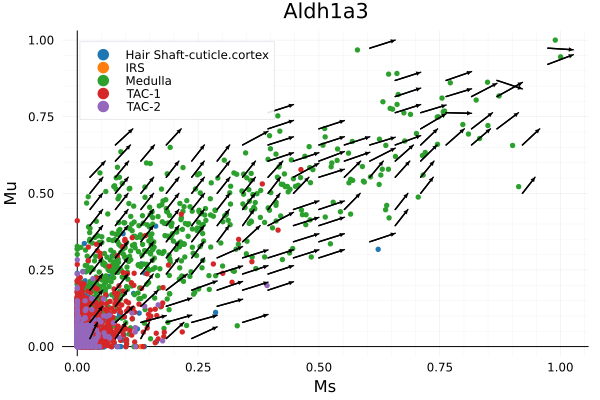

In [23]:
p1 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx], X[1, celltype .== label, idx], label = label, xlabel = "Ms", ylabel = "Mu", title = "Aldh1a3", color = palattes[label])
end
quiver!(point_vector[:, 1], point_vector[:, 2], quiver = (arrow_vector[:, 1], arrow_vector[:, 2]), arrow = arrow(:closed), color = "#000000")

In [24]:
idx2 = findfirst(x -> x == "Anln", genes)

10

In [25]:
arrow_vector1, point_vector1 = gene_plot(X[:, :, idx2], velocity[:, :, idx2])

([-0.0058208693976858706 -0.05263157894736842; 0.03250459173476311 -0.05263157894736842; … ; -0.052631578947368474 -0.01606979584285631; -0.01861780464740347 -0.05263157894736848], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.23684210526315788; 0.9736842105263157 0.763157894736842])

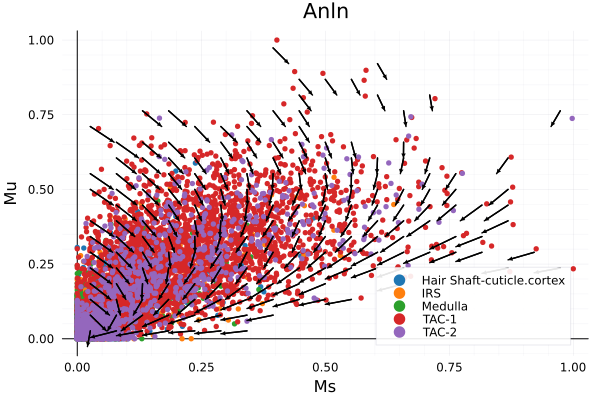

In [26]:
p2 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx2], X[1, celltype .== label, idx2], label = label, xlabel = "Ms", ylabel = "Mu", title = "Anln", color = palattes[label])
end
quiver!(point_vector1[:, 1], point_vector1[:, 2], quiver = (arrow_vector1[:, 1], arrow_vector1[:, 2]), arrow = arrow(:closed), color = "#000000")

In [27]:
idx3 = findfirst(x -> x == "Adamts9", genes)

4

In [28]:
arrow_vector2, point_vector2 = gene_plot(X[:, :, idx3], velocity[:, :, idx3])

([0.025405459140285733 -0.05263157894736842; 0.03926967925019276 -0.05263157894736842; … ; -0.052631578947368474 -0.027703114642781607; -0.026550896021180753 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.3421052631578947; 0.9736842105263157 0.6578947368421053])

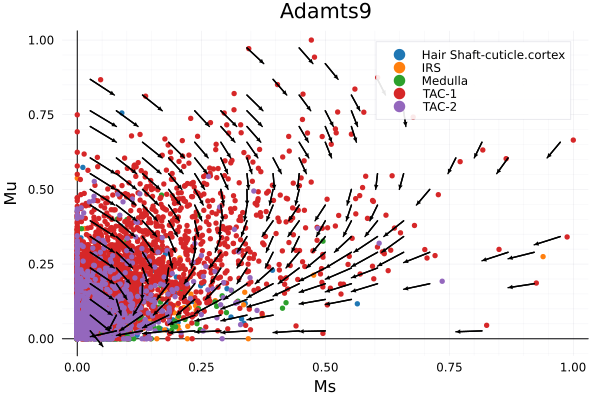

In [29]:
p3 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx3], X[1, celltype .== label, idx3], label = label, xlabel = "Ms", ylabel = "Mu", title = "Adamts9", color = palattes[label])
end
quiver!(point_vector2[:, 1], point_vector2[:, 2], quiver = (arrow_vector2[:, 1], arrow_vector2[:, 2]), arrow = arrow(:closed), color = "#000000")

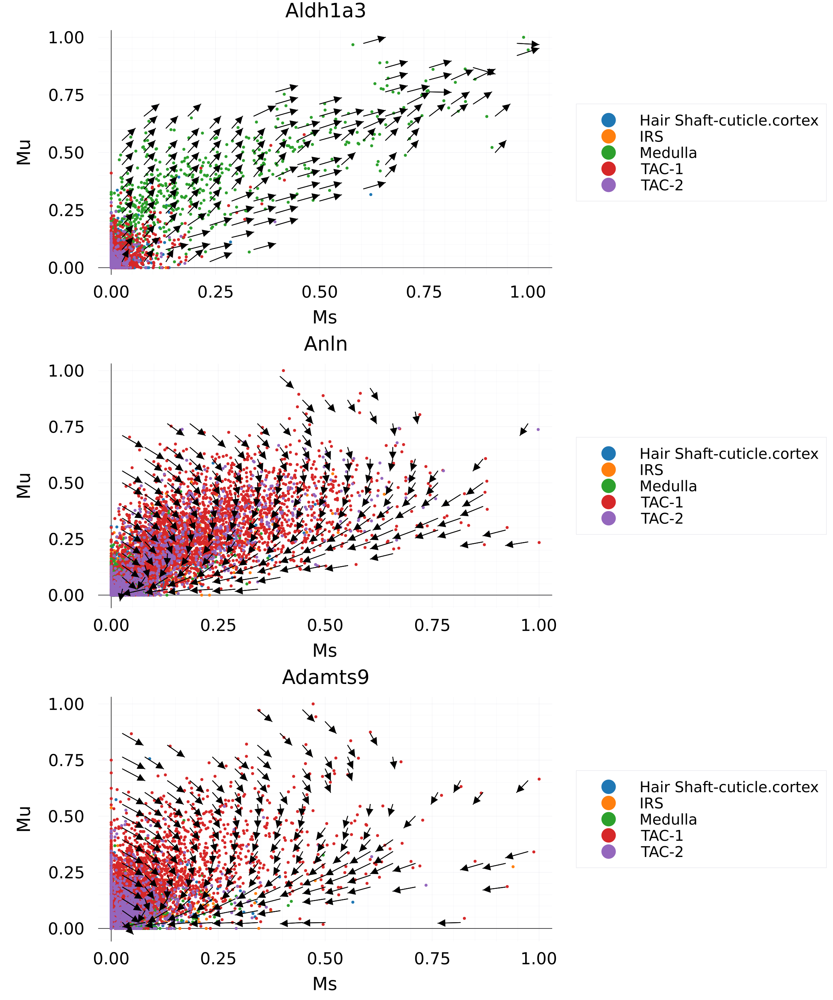

In [30]:
GR.setarrowsize(0.5)
l = @layout [grid(3, 1)]
p = plot(p1, p2, p3, layout = l, size = (1500, 1800), dpi = 150, left_margins = 1.5Plots.cm, legendfontsize = 18, legend = :outerright, titlefontsize = 24, 
    xtickfontsize = 20, ytickfontsize = 20, xguidefontsize = 22, yguidefontsize = 22)

In [31]:
savefig(p, "figure/JuloVelo_velocity_vector.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_skin/figure/JuloVelo_velocity_vector.png"

## Kinetic embedding

In [32]:
kinetics_embedding(adata);

In [33]:
embedding = adata.obsm["kinetics_pca"];

In [34]:
celltype = adata.obs[!, "celltype"]
labels = sort(unique(celltype))

5-element Vector{String}:
 "Hair Shaft-cuticle.cortex"
 "IRS"
 "Medulla"
 "TAC-1"
 "TAC-2"

In [35]:
theme(:vibrant, framestyle = :axes, grid = true, markersize = 5, linewidth = 1.4, palette = :tab20) 

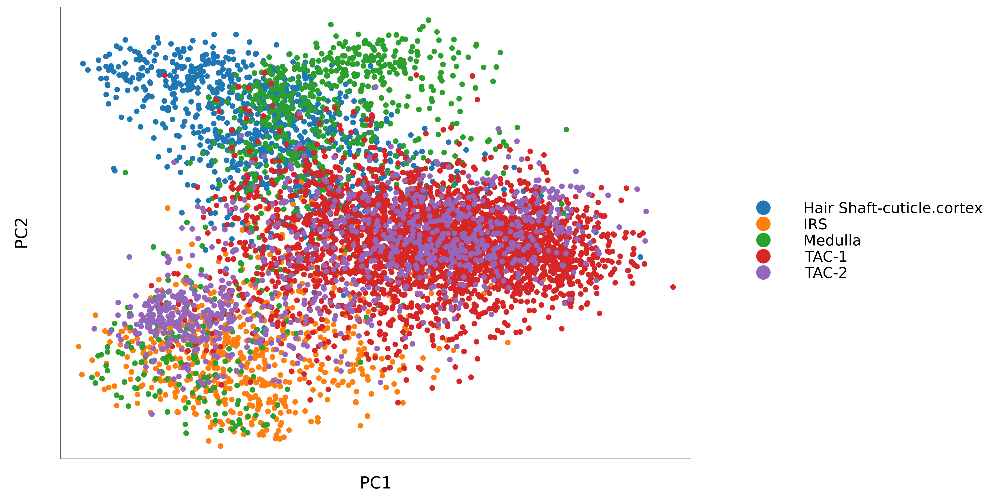

In [36]:
p = scatter(size = (1600, 800), fg_legend = :transparent, left_margin = 1.8Plots.cm, bottom_margin = 1.0Plots.cm, dpi = 300) #
for label in labels
    scatter!(embedding[celltype .== label, 1], embedding[celltype .== label, 2], label = label, legend=:outerright, legendfontsize = 16, color = palattes[label]
        , xlabel = "PC1", ylabel = "PC2", xtick = nothing, yticks = nothing, xguidefontsize = 18, yguidefontsize = 18)
end
p

In [37]:
savefig(p, "figure/mouse_skin_kinetic_embedding.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/Mouse_skin/figure/mouse_skin_kinetic_embedding.png"